# ИГРА "НАЙДИ ДРУЗЕЙ"

* на плоскости живут точки $K$ типов
* точки одного типа - друзьяшки
* у каждой точки 8 соседей (по углам тоже считаем!)
* точка СЧАСТЛИВА, если хотя бы $T$ соседей --- друзья

Если точка несчастна, она пытается переместиться. По каким правилам - посмотрим разные.

In [1]:
from FindYourFriends import *
%matplotlib inline

# Игра 5. Свободные земли (продолжение)

Попробуем ужать свободного пространства: ну на рисунке с лекции его явно не 0.5 (?). Во имя гитхаба, картинки для порогов 3 и 4 не прикладываю, они похожи на те, что со свободным пространством 0.5. А вот для порога 5, когда "формирования" начинают двигаться...

In [2]:
class Conquer(World):
    def __init__(self, EMPTY_SPACE=0.3, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.A[1:-1, 1:-1][np.random.random(size=(self.SIZE, self.SIZE)) < EMPTY_SPACE] = -2
    
    def where_to_run(self, x, y):
        # мы готовы идти только в пустую клетку, которая ещё не двигалась на этой итерации
        return [(cx, cy) for cx, cy in neighbours(x, y) if self.A[cx][cy] == -2 and self.dissatisfied[cx][cy]]

40000 итераций (почти час :( в моей реализации), показано с шагом в 200 итераций. 

In [ ]:
world = Conquer(SATISFACTION_THRESHOLD=5, EMPTY_SPACE=0.3)
for _ in tqdm(range(40000)):
    world.iteration()


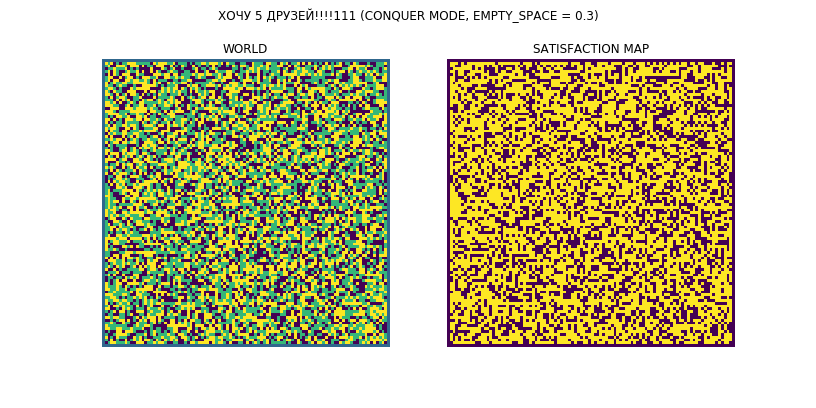
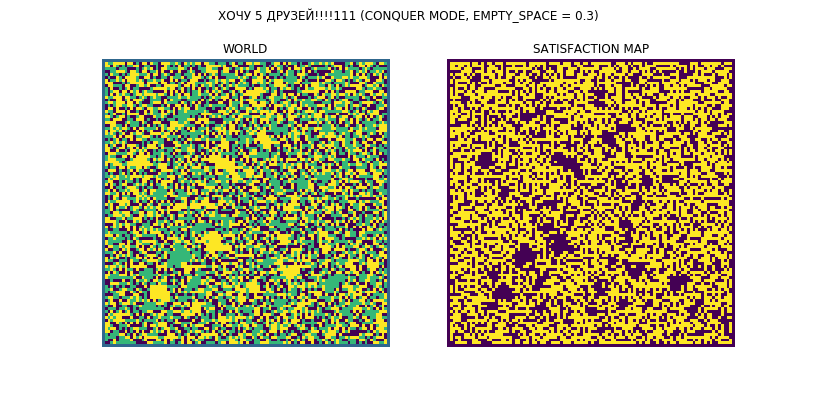
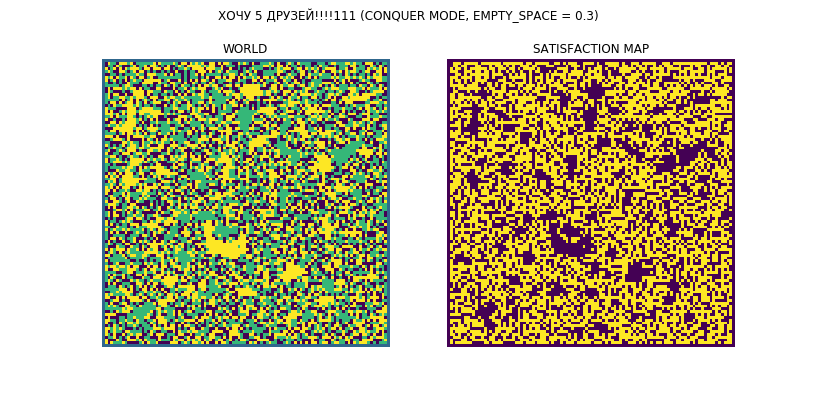
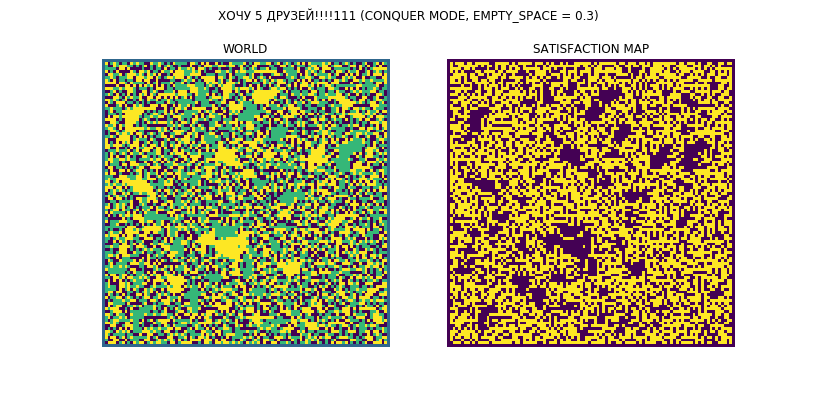
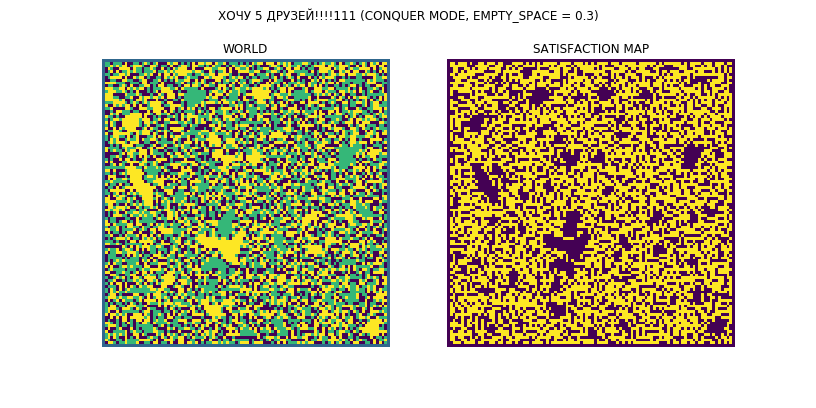
...
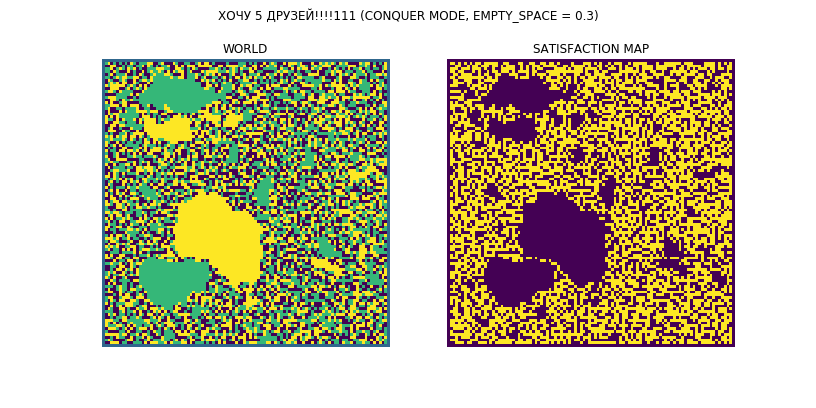
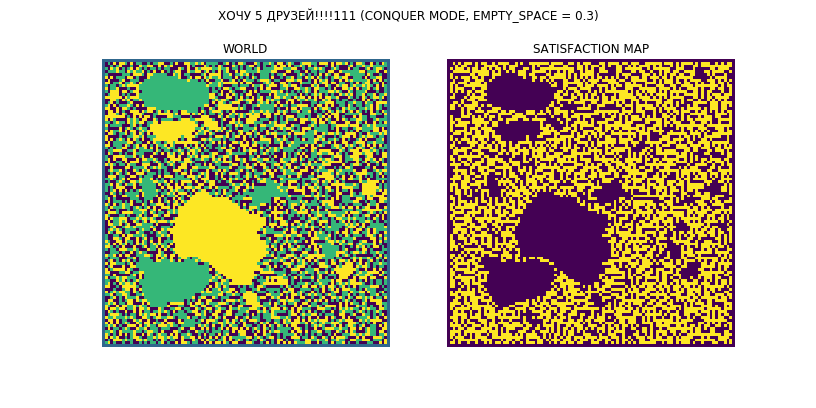
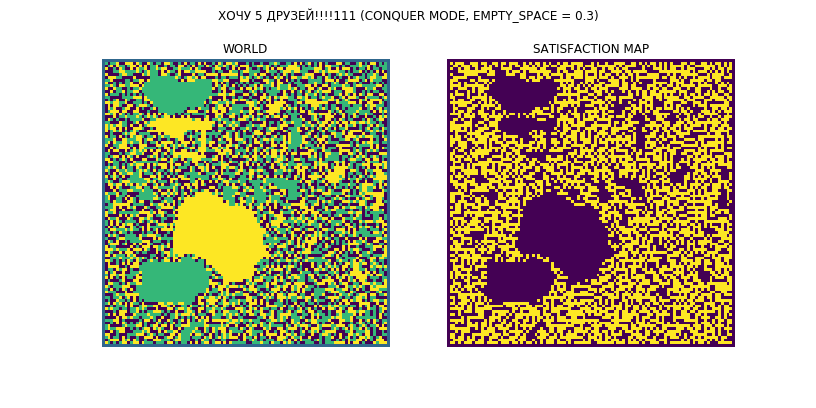
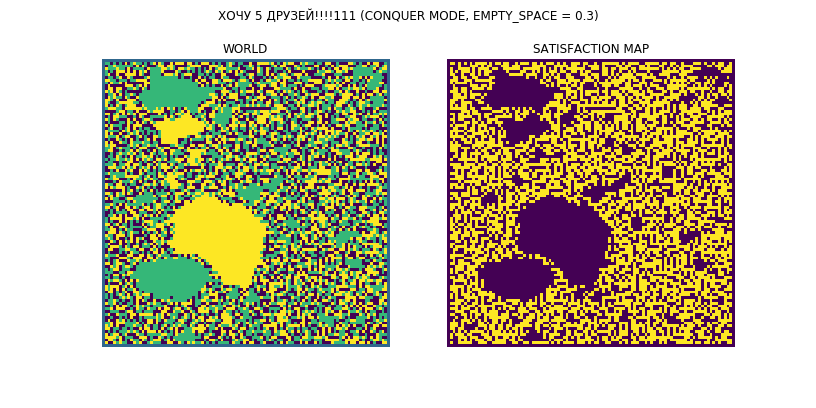
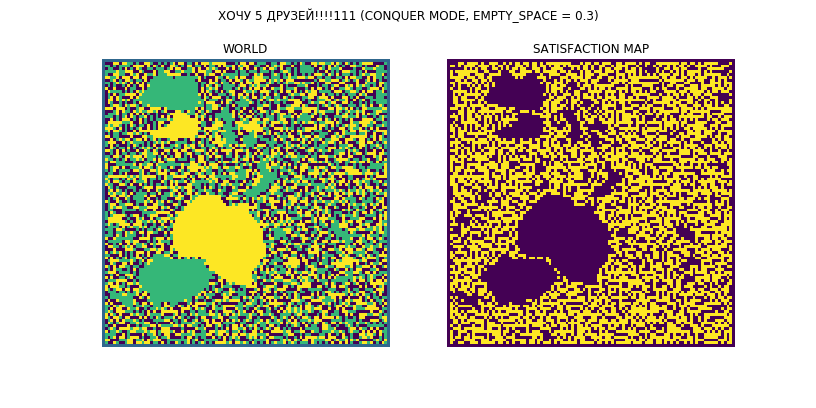

In [5]:
show_frames("ХОЧУ 5 ДРУЗЕЙ!!!!111 (CONQUER MODE, EMPTY_SPACE = 0.3)", world.world_map[::200], world.dissatisfied_map[::200])

Наверное, эта сказка продолжится, но как-то долго эти формации склеиваются. Хотя бы они появляются и начали гулять, попробуем подобрать EMPTY_SPACE ещё получше, например, 0.2. Снова 40000 итераций, каждый 200-ый кадр.

In [6]:
world = Conquer(SATISFACTION_THRESHOLD=5, EMPTY_SPACE=0.2)
for _ in tqdm(range(40000)):
    world.iteration()

100%|████████████████████████████████████| 40000/40000 [38:46<00:00, 17.19it/s]



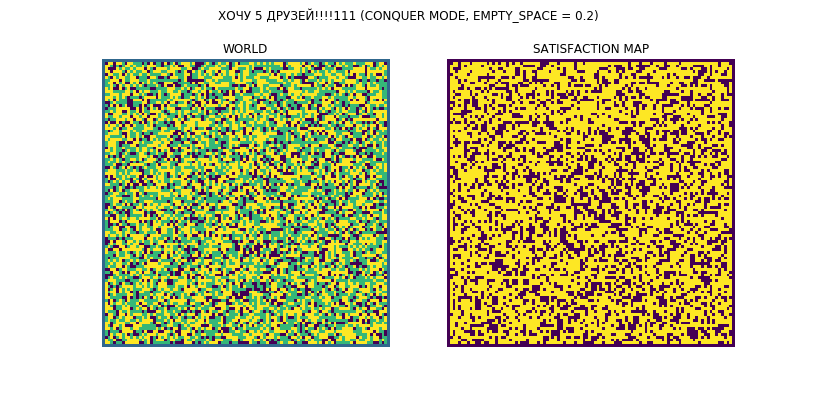
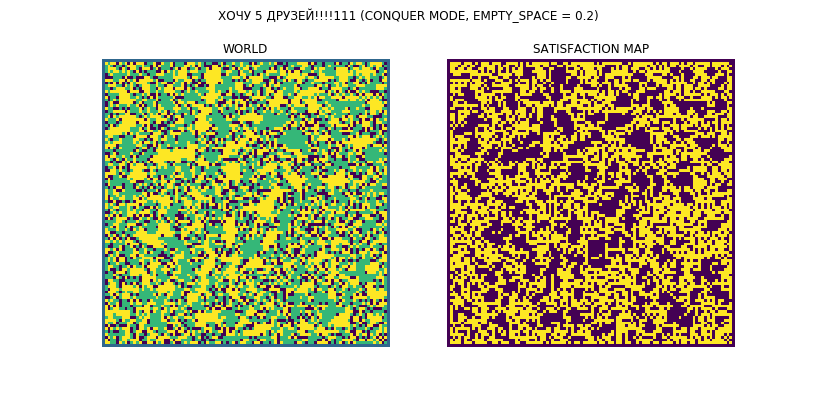
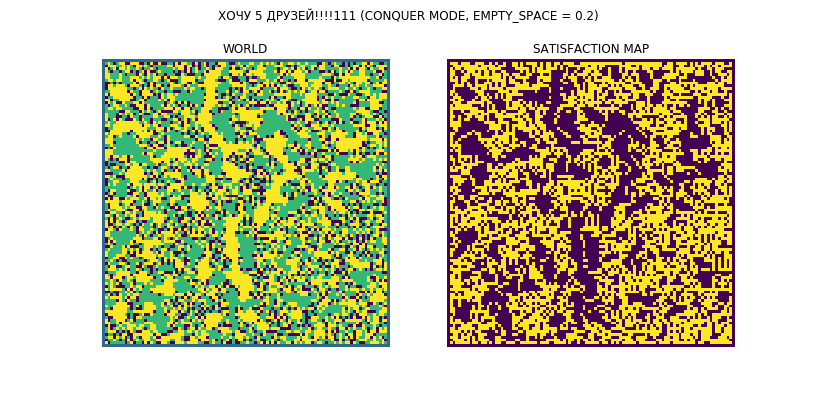
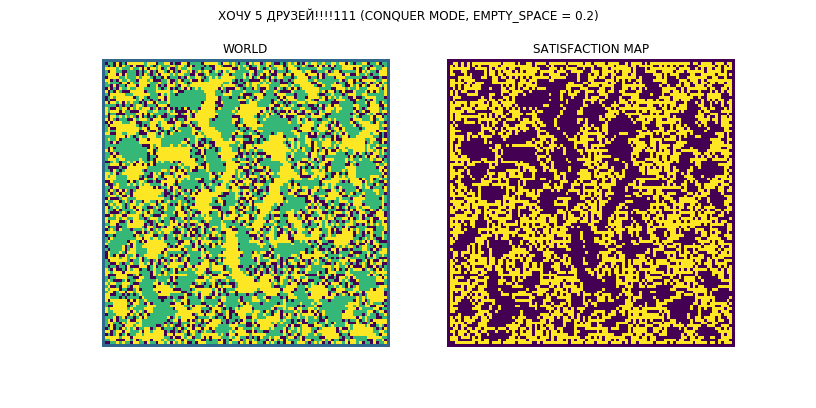
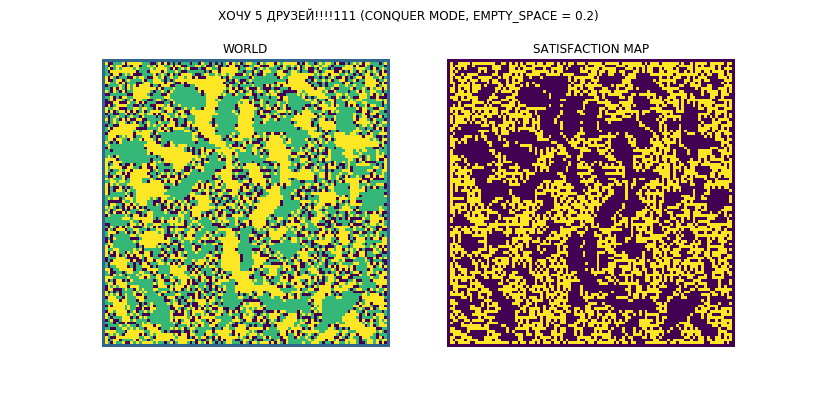
...
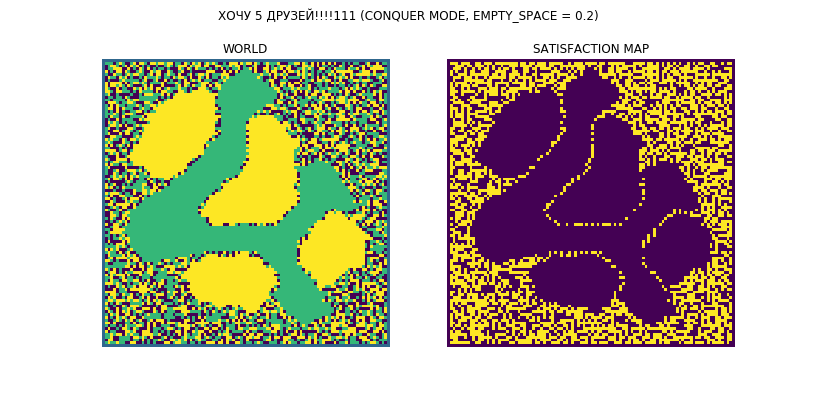
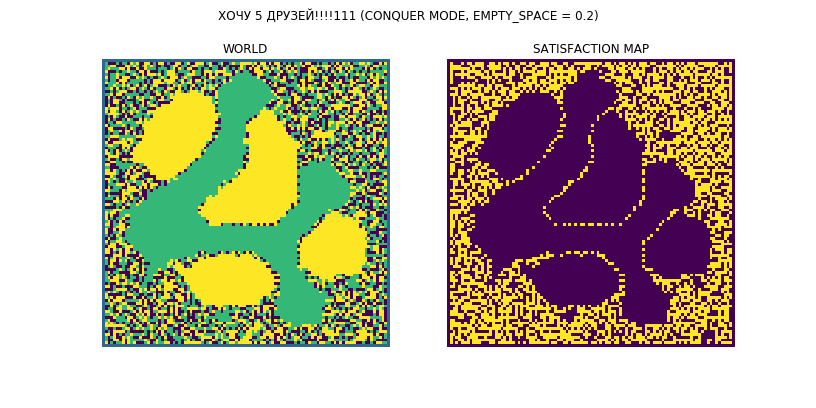
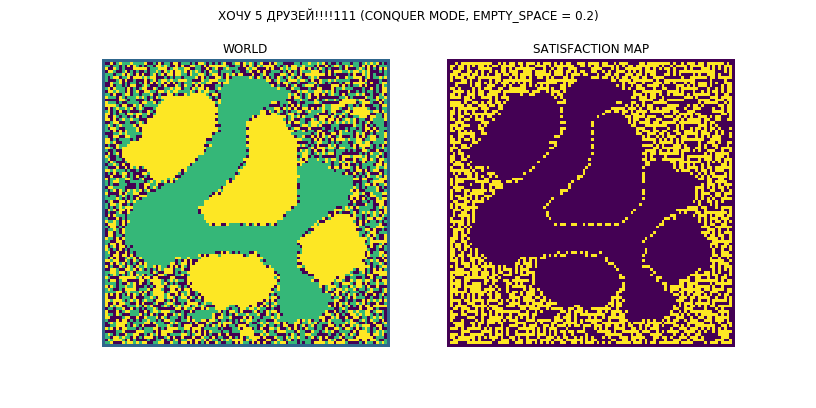
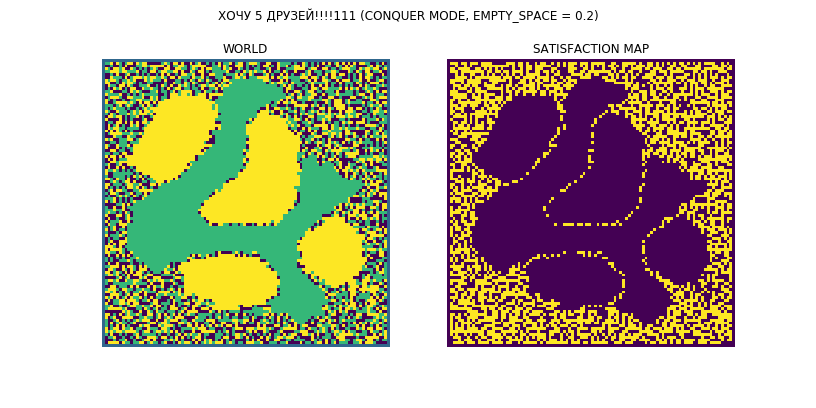
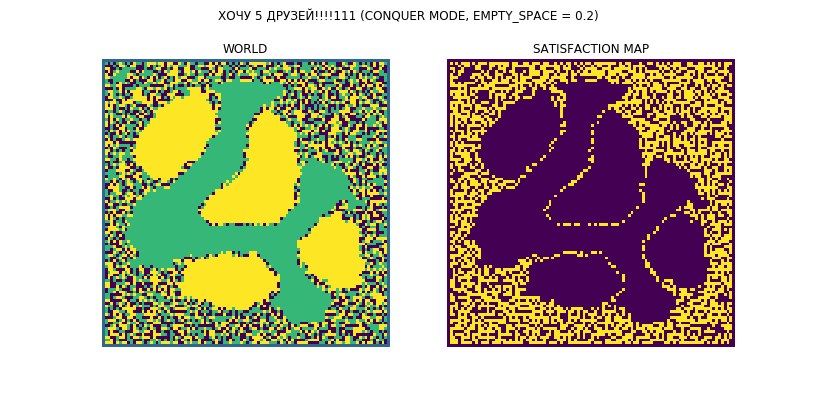

In [7]:
show_frames("ХОЧУ 5 ДРУЗЕЙ!!!!111 (CONQUER MODE, EMPTY_SPACE = 0.2)", world.world_map[::200], world.dissatisfied_map[::200])

Хм... возможно, если запустить много раз, однажды получится облачко одного типа с одной стороны, облачко второго с другой... Но это скорее размахивания руками.

Выводы:
* "локальные предпочтения формируют глобальные паттерны" - подтверждено, узоры считаются.
* "если хотим много друзей, отделимся на два полюса" - не подтверждено, только если очень крупно не повезёт, и нужные гиперпараметры нашего мира будут очень неудачно выставлены.